# Version information

In [18]:
import pyleecan


In [1]:
from datetime import date
print("Running date:", date.today().strftime("%B %d, %Y"))
import pyleecan
print("Pyleecan version:" + pyleecan.__version__)
import SciDataTool
print("SciDataTool version:" + SciDataTool.__version__)


Running date: July 11, 2022
Pyleecan version:1.3.9
SciDataTool version:2.4.9


# Force Module을 사용하여 자기력을 계산하는 방법

이 튜토리얼은 pyleecan으로 **자기력을 계산**하는 다양한 단계를 보여줍니다.

SciDataTool 개체의 기능과 사용법을 설명하기 위해 FEMM뮬레이션을 실행하고 전류를 인가하여 실행 시간을 줄이기 위해 주기성과 병렬연산을 사용합니다.

z:\01_codes_projects\pyleecan_fork\pyleecan\Methods\Machine\Machine\plot.py:190: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


0.00193

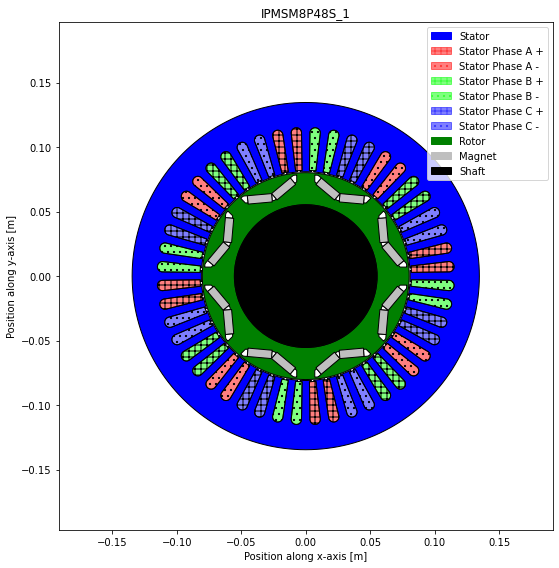

In [2]:
%matplotlib inline

# Load the machine
from os.path import join
from numpy import (
    zeros,
    exp,
    pi,
    real,
    meshgrid,
    mean,
)

# 힘 계산 클래스 추가
from pyleecan.Classes.ForceMT import ForceMT
from pyleecan.Classes.OPdq import OPdq
from pyleecan.Classes.Simu1 import Simu1
from pyleecan.Classes.MagFEMM import MagFEMM
from pyleecan.Classes.InputCurrent import InputCurrent
from pyleecan.definitions import DATA_DIR


from pyleecan.Functions.load import load
from pyleecan.Functions.Plot import dict_2D, dict_3D 

# print(DATA_DIR)

path = 'D:/NGV/Lecture_Simu_Model'
modelname = 'IPMSM8P48S1'
model = join(modelname+'.json')

# Load machine
Toyota_Prius = load(join(path,model))
Toyota_Prius.plot()
save_path='D:/NGV/result_parasweep'
Toyota_Prius.stator.slot.W0

In [3]:
import numpy as np
from pyleecan.Classes.ImportMatrixVal import ImportMatrixVal
from pyleecan.Classes.InputCurrent import InputCurrent
from pyleecan.Classes.ImportGenVectLin import ImportGenVectLin
from pyleecan.Classes.ImportGenVectSin import ImportGenVectSin
from pyleecan.Classes.ImportGenMatrixSin import ImportGenMatrixSin
ref_simu = Simu1(name="Toyota_current_sweep", machine=Toyota_Prius)

# # Definition of the enforced output of the electrical module
# Is_mat = zeros((1, 3))
# Is_mat[0, :] = np.array([0, 12.2474, -12.2474])
# Is = ImportMatrixVal(value=Is_mat)
# time = ImportGenVectLin(start=0, stop=0, num=1, endpoint=False)
# Na_tot = 2048

## Simu 1 Simulation (No-load)

In [15]:
from numpy import sqrt, pi
ref_simu.input = InputCurrent()
ref_simu.input.Nt_tot = 128 # Number of time step
ref_simu.input.Na_tot = 2048 # Spatial discretization
# Set reference simulation operating point
ref_simu.input.OP = OPdq(N0 = 2000) # Rotor speed [rpm]
ref_simu.input.OP.Tem_av_ref = 353
ref_simu.input.OP.set_I0_Phi0(I0=250/sqrt(2), Phi0=140*pi/180)


# Definition of the magnetic simulation
ref_simu.mag = MagFEMM(
    type_BH_stator=0,
    type_BH_rotor=0,
    is_periodicity_a=True,
    is_periodicity_t=True,
    Kgeo_fineness=0.2,
    Kmesh_fineness=0.2,
    nb_worker=2,
)
ref_simu.force=ForceMT(  is_periodicity_a=True,is_periodicity_t=True,)

In [16]:
from pyleecan.Classes.VarLoadCurrent import VarLoadCurrent
import csv
import numpy as np



# Build OP_matrix with a meshgrid of Id/Iq
# N_speed = Tem_av_ref.size

varload = VarLoadCurrent()
varload.type_OP_matrix =1 # Matrix N0

n_Id=20
n_Iq=20
Id_min, Id_max = -230, 230
Iq_min, Iq_max = -230, 230
Id, Iq = np.meshgrid(
np.linspace(Id_min, Id_max, n_Id), np.linspace(Iq_min, Iq_max, n_Iq)
)

## OPMatrix 만들기
OP_matrix = np.zeros((n_Id * n_Iq, 3))
LUT_path='D:\KDH\Manatee\Download\Demo_Data-4\Demo_Data\Toyota_Prius_speed_Id_Iq_750_7500.csv'
with open(LUT_path, 'r') as f:
    OP_matrix = list(csv.reader(f, delimiter=","))

OP_matrix = np.array(OP_matrix)
# data=data.reshape(3,15)
print(OP_matrix)

# OP_matrix[:, 0] = ref_simu.input.OP.N0

OP_matrix = OP_matrix.astype(np.float)
OP_matrix[:, 1] = OP_matrix[:, 1]/np.sqrt(2) #ravel() 다차원 배열 1차원 변환 함수
OP_matrix[:, 2] = OP_matrix[:, 1]/np.sqrt(2)
varload.OP_matrix = OP_matrix
# len(OP_matrix)
print(OP_matrix)

[['750' '-134.0327975' '105.9903568']
 ['959.1836735' '-134.0327975' '105.9903568']
 ['1112.244898' '-134.0327975' '105.9903568']
 ['1265.306122' '-134.0327975' '105.9903568']
 ['1418.367347' '-134.0327975' '105.9903568']
 ['1571.428571' '-134.0327975' '105.9903568']
 ['1724.489796' '-118.4557246' '97.36905366']
 ['1877.55102' '-102.8786516' '88.74775057']
 ['2030.612245' '-92.34912393' '83.48191944']
 ['2183.673469' '-81.81959623' '78.21608832']
 ['2336.734694' '-77.1356942' '74.96024215']
 ['2489.795918' '-72.45179216' '71.70439597']
 ['2642.857143' '-67.76789013' '68.4485498']
 ['2795.918367' '-63.08398809' '65.19270362']
 ['2948.979592' '-58.40008606' '61.93685745']
 ['3102.040816' '-53.71618402' '58.68101127']
 ['3255.102041' '-49.03228198' '55.4251651']
 ['3408.163265' '-44.34837995' '52.16931892']
 ['3561.22449' '-42.61901858' '50.86831256']
 ['3714.285714' '-40.88965721' '49.56730621']
 ['3867.346939' '-39.16029584' '48.26629985']
 ['4020.408163' '-37.43093446' '46.9652935']
 [

C:\Users\KDH2018-PC\AppData\Local\Temp\ipykernel_26736\2129607904.py:33: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [17]:

print(varload.OP_matrix)
# All the simulation use the same machine
# No need to draw the machine for all OP
varload.is_reuse_femm_file=True  

simu_vop = ref_simu.copy()
simu_vop.var_simu = varload
simu_vop.var_simu.is_keep_all_output = True

Xout_vop = simu_vop.run()
# Id_ref = (I0_rms*exp(1j*Phi0)).real # [Arms] 
# Iq_ref = (I0_rms*exp(1j*Phi0)).imag # [Arms] 
# fig = Xout_vop.plot_multi("Id", "Iq")


[[ 750.          -94.77550001  -67.01639875]
 [ 959.1836735   -94.77550001  -67.01639875]
 [1112.244898    -94.77550001  -67.01639875]
 [1265.306122    -94.77550001  -67.01639875]
 [1418.367347    -94.77550001  -67.01639875]
 [1571.428571    -94.77550001  -67.01639875]
 [1724.489796    -83.76084614  -59.2278623 ]
 [1877.55102     -72.74619219  -51.4393258 ]
 [2030.612245    -65.30069177  -46.17456197]
 [2183.673469    -57.85519133  -40.90979811]
 [2336.734694    -54.54317244  -38.5678471 ]
 [2489.795918    -51.23115355  -36.22589608]
 [2642.857143    -47.91913466  -33.88394506]
 [2795.918367    -44.60711576  -31.54199404]
 [2948.979592    -41.29509687  -29.20004303]
 [3102.040816    -37.98307798  -26.85809201]
 [3255.102041    -34.67105909  -24.51614099]
 [3408.163265    -31.3590402   -22.17418997]
 [3561.22449     -30.13619705  -21.30950929]
 [3714.285714    -28.91335389  -20.4448286 ]
 [3867.346939    -27.69051074  -19.58014792]
 [4020.408163    -26.46766758  -18.71546723]
 [4173.469

c:\Users\KDH2018-PC\anaconda3\envs\py38_plcan\lib\site-packages\scidatatool-2.4.9-py3.8.egg\SciDataTool\Functions\Plot\plot_2D.py:539: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


parent = <class 'SciDataTool.Classes.DataTime.DataTime'> object
symbol = ""
name = "time"
unit = "s"
normalizations[elec_order] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	ref = 133.33333333333334
	


normalizations[mech_order] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	ref = 33.333333333333336
	


normalizations[angle_elec] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	ref = -0.001193662073189215
	


normalizations[angle_rotor] =parent = <class 'SciDataTool.Classes.DataLinspace.DataLinspace'> object
	unit = "SI"
	slope = -12000.0
	offset = 52.499916190471666
	


initial = 0.0
final = 0.0035156249999999997
step = None
number = 16
include_endpoint = True
is_components = False
symmetries = {'antiperiod': 8}
is_overlay = False

[[ 750.          -94.77550001  -67.01639875]
 [ 959.1836735   -94.77550001  -67.01639875]
 [1112.244898    -94.77550001  -67.01639875]
 [

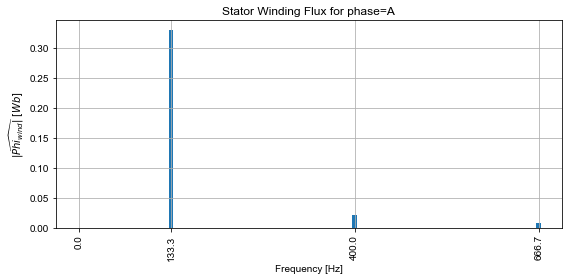

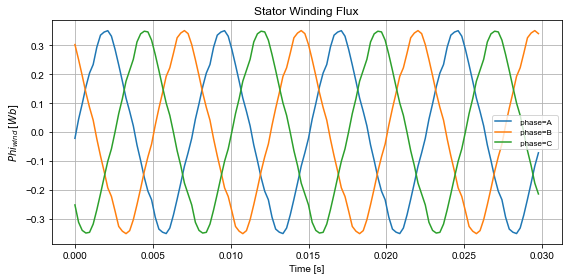

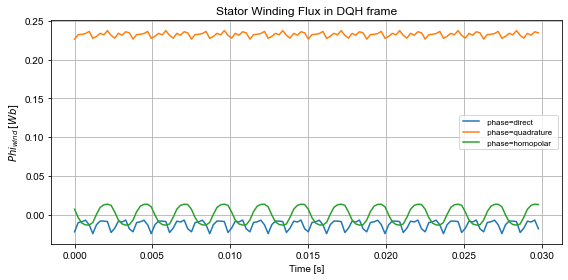

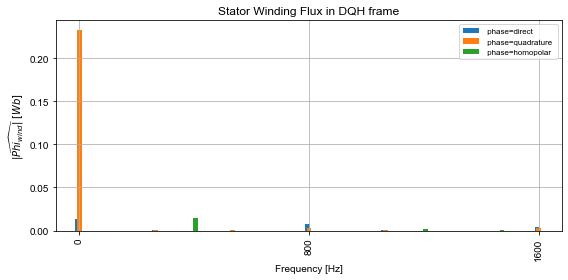

In [7]:
from pyleecan.Functions.Electrical.dqh_transformation import (
    get_phase_dir_DataTime,
    n2dqh_DataTime,
)

# print("Values available in XOutput:")
# print(Xout_vop.xoutput_dict.keys())
(Xout_vop.mag.Phi_wind_stator.plot_2D_Data('freqs'))
# print(Xout_vop.elec)
Xout_vop.mag.Phi_wind_stator.plot_2D_Data('time',"phase[]")

Phi_dqh0 = n2dqh_DataTime(
    Xout_vop.mag.Phi_wind_stator,
    is_dqh_rms=True,
    # phase_dir=Xout_vop.get_phase_dir(),
)
Phi_dqh0.plot_2D_Data(
"time",
"phase[]"
)
Phi_dqh0.plot_2D_Data(
"freqs",
"phase[]"
)
print(Xout_vop.mag.Phi_wind_stator.axes[0])
# # Xout_vop['']
print(Xout_vop.simu.var_simu.OP_matrix,Xout_vop["Tem_av"].result)
# print("\nComputed Average Torque for each simulation:")
print(len(OP_matrix))
print(len(Xout_vop['Tem_av'].result))
# print("\nComputed Average Torque of the reference simulation:")
# print(Xout_vop["Tem_av"].result_ref)

 code 정리 필요

In [8]:
fr_r0_6fs=[]
ft_r0_6fs=[]
fr_r0_12fs=[]
ft_r0_12fs=[]
fr_r24_6fs=[]
ft_r24_6fs=[]
ft_rn24_6fs=[]

ft_r0_0fs=[]
Torque_map=[]
Torque_rip=[]


## 45 x 3 -> 3 x 45
op_f=OP_matrix.transpose()
print(op_f)
print('OP_matrix shape',OP_matrix.shape)
print('coloum',OP_matrix.shape[1])
print('op_transpose',op_f.shape)
op_f=op_f.ravel()
print('op_ravel',op_f.shape)

## 45 x 1

## list to ndarray
Torque_map=(Xout_vop['Tem_av'].result)
Phidq_map=[]
Torque_map=np.array((Torque_map))
Torque_map=Torque_map.ravel()

print('Torque_map_ravel',Torque_map.shape)
## append

map_f_csv=np.append(op_f,Torque_map)
map_f_csv=map_f_csv.reshape(OP_matrix.shape[1]+1,len(OP_matrix))
map_f_csv=map_f_csv.transpose()

# map_f_csv=map_f_csv.reshape(4,45)
print(map_f_csv.shape)
map_f_csv

np.savetxt('Torque_map_OP_map.csv',map_f_csv,delimiter=",")

# # Get unique Id, Iq sorted in ascending order(len(Xout_vop.output_list))
# XId, jd = np.unique(OP_matrix[:, 1], return_inverse=True)
# XIq, jq = np.unique(OP_matrix[:, 2], return_inverse=True)
# nd, nq = XId.size, XIq.size

# Ploss_dqh_mat = np.zeros((nd, nq, 5))
# Ploss_dqh_interp = scp_int.RegularGridInterpolator(
#     (XId, XIq), Ploss_dqh_mat, method="linear"
# )

# force_map.reshape(nd,nq)

[[ 750.          959.1836735  1112.244898   1265.306122   1418.367347
  1571.428571   1724.489796   1877.55102    2030.612245   2183.673469
  2336.734694   2489.795918   2642.857143   2795.918367   2948.979592
  3102.040816   3255.102041   3408.163265   3561.22449    3714.285714
  3867.346939   4020.408163   4173.469388   4326.530612   4479.591837
  4632.653061   4785.714286   4938.77551    5091.836735   5244.897959
  5397.959184   5551.020408   5704.081633   5857.142857   6010.204082
  6163.265306   6316.326531   6469.387755   6622.44898    6775.510204
  6928.571429   7081.632653   7234.693878   7387.755102   7500.        ]
 [ -94.77550001  -94.77550001  -94.77550001  -94.77550001  -94.77550001
   -94.77550001  -83.76084614  -72.74619219  -65.30069177  -57.85519133
   -54.54317244  -51.23115355  -47.91913466  -44.60711576  -41.29509687
   -37.98307798  -34.67105909  -31.3590402   -30.13619705  -28.91335389
   -27.69051074  -26.46766758  -25.24482443  -24.02198128  -22.79913813
   -21.

In [10]:
import pandas as pd
force_map_pd=pd.DataFrame(map_f_csv)

In [12]:
from scipy.interpolate import griddata
import plotly.offline as offline
from plotly.graph_objs import Figure, Surface
import plotly.graph_objects as go
ngrid_x=300
ngrid_y=300

xr =np.linspace(-230, 230, ngrid_x)
yr= np.linspace(-230, 230, ngrid_y)
xr, yr = np.meshgrid(xr, yr)


torque_data = griddata((force_map_pd[1], force_map_pd[2]), force_map_pd[3], (xr, yr) , method='linear')
r06fs_force = griddata((force_map_pd[1], force_map_pd[2]), force_map_pd[3], (xr, yr) , method='linear')


QhullError: QH6154 Qhull precision error: Initial simplex is flat (facet 1 is coplanar with the interior point)

While executing:  | qhull d Qc Qbb Qt Q12 Qz
Options selected for Qhull 2019.1.r 2019/06/21:
  run-id 603356424  delaunay  Qcoplanar-keep  Qbbound-last  Qtriangulate
  Q12-allow-wide  Qz-infinity-point  _pre-merge  _zero-centrum  Qinterior-keep
  Pgood  _max-width 83  Error-roundoff 1.3e-13  _one-merge 9.2e-13
  Visible-distance 2.6e-13  U-max-coplanar 2.6e-13  Width-outside 5.3e-13
  _wide-facet 1.6e-12  _maxoutside 1.1e-12

The input to qhull appears to be less than 3 dimensional, or a
computation has overflowed.

Qhull could not construct a clearly convex simplex from points:
- p8(v4):   -65   -46    40
- p13(v3):   -45   -32    18
- p44(v2):   -12  -8.5     0
- p0(v1):   -95   -67    86

The center point is coplanar with a facet, or a vertex is coplanar
with a neighboring facet.  The maximum round off error for
computing distances is 1.3e-13.  The center point, facets and distances
to the center point are as follows:

center point   -54.16    -38.3    36.03

facet p13 p44 p0 distance= 5.2e-16
facet p8 p44 p0 distance= -1.8e-15
facet p8 p13 p0 distance= -4.1e-15
facet p8 p13 p44 distance=    0

These points either have a maximum or minimum x-coordinate, or
they maximize the determinant for k coordinates.  Trial points
are first selected from points that maximize a coordinate.

The min and max coordinates for each dimension are:
  0:    -94.78  -2.225e-308  difference= 94.78
  1:    -67.02  -2.225e-308  difference= 67.02
  2:         0     94.78  difference= 94.78

If the input should be full dimensional, you have several options that
may determine an initial simplex:
  - use 'QJ'  to joggle the input and make it full dimensional
  - use 'QbB' to scale the points to the unit cube
  - use 'QR0' to randomly rotate the input for different maximum points
  - use 'Qs'  to search all points for the initial simplex
  - use 'En'  to specify a maximum roundoff error less than 1.3e-13.
  - trace execution with 'T3' to see the determinant for each point.

If the input is lower dimensional:
  - use 'QJ' to joggle the input and make it full dimensional
  - use 'Qbk:0Bk:0' to delete coordinate k from the input.  You should
    pick the coordinate with the least range.  The hull will have the
    correct topology.
  - determine the flat containing the points, rotate the points
    into a coordinate plane, and delete the other coordinates.
  - add one or more points to make the input full dimensional.


In [14]:
r246fs_force = griddata((force_map_pd[1], force_map_pd[2]), force_map_pd[4], (xr, yr) , method='linear')
r246fs_force

KeyError: 4

In [155]:
from plotly.subplots import make_subplots
fig_I = make_subplots(rows=3, cols=2,x_title='Id[Arms]',y_title='Iq[Arms]',subplot_titles=('Tev','','r0_6fs','','r24_6fs')
                    ,shared_xaxes=False,shared_yaxes=False,vertical_spacing=0.2)

fig_I.add_trace(
(go.Contour(x=xr[0], y=yr[:, 0], z=torque_data, connectgaps = False,
                         colorscale='Jet', 
                         contours=dict()                        
                       
)),row=1, col=1)

fig_I.add_trace(
(go.Contour(x=xr[0], y=yr[:, 0], z=r06fs_force, connectgaps = False,
                         colorscale='Jet', 
                         contours=dict()                        
                       
)),row=2, col=1)
fig_I.add_trace(
(go.Contour(x=xr[0], y=yr[:, 0], z=r246fs_force, connectgaps = False,
                         colorscale='Jet', 
                         contours=dict()                        
                       
)),row=3, col=1)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'colorscale': [[0.0, 'rgb(0,0,131)'], [0.2, 'rgb(0,60,170)'], [0.4,
                             'rgb(5,255,255)'], [0.6, 'rgb(255,255,0)'], [0.8,
                             'rgb(250,0,0)'], [1.0, 'rgb(128,0,0)']],
              'connectgaps': False,
              'type': 'contour',
              'x': array([-230.        , -228.46153846, -226.92307692, ...,  226.92307692,
                           228.46153846,  230.        ]),
              'xaxis': 'x',
              'y': array([-230.        , -228.46153846, -226.92307692, ...,  226.92307692,
                           228.46153846,  230.        ]),
              'yaxis': 'y',
              'z': array([[-522.98060035, -521.81350556, -520.64641076, ...,  -36.09992554,
                            -35.27107322,  -34.4422209 ],
                          [-522.27564872, -521.10855392, -519.94145912, ...,  -35.4393884 ,
                            -34.61053608,  -33.78168375],
                          [-521.57069709, -520.40360229, -519.23650749, ...,  -34.77885126,
                            -33.94999893,  -33.12114661],
                          ...,
                          [ 521.1742922 ,  520.00287359,  518.83145499, ...,   34.85410612,
                             34.03388937,   33.21367262],
                          [ 521.87967624,  520.70825764,  519.53683903, ...,   35.51034824,
                             34.69013149,   33.86991474],
                          [ 522.58506029,  521.41364168,  520.24222307, ...,   36.16659036,
                             35.34637361,   34.52615685]])},
             {'colorscale': [[0.0, 'rgb(0,0,131)'], [0.2, 'rgb(0,60,170)'], [0.4,
                             'rgb(5,255,255)'], [0.6, 'rgb(255,255,0)'], [0.8,
                             'rgb(250,0,0)'], [1.0, 'rgb(128,0,0)']],
              'connectgaps': False,
              'type': 'contour',
              'x': array([-230.        , -228.46153846, -226.92307692, ...,  226.92307692,
                           228.46153846,  230.        ]),
              'xaxis': 'x3',
              'y': array([-230.        , -228.46153846, -226.92307692, ...,  226.92307692,
                           228.46153846,  230.        ]),
              'yaxis': 'y3',
              'z': array([[11477.64381642, 11473.97723482, 11470.31065321, ...,  1129.57263115,
                            1120.12008128,  1110.66753141],
                          [11503.47224066, 11499.80565906, 11496.13907745, ...,  1142.18272832,
                            1132.73017845,  1123.27762858],
                          [11529.3006649 , 11525.6340833 , 11521.96750169, ...,  1154.79282549,
                            1145.34027562,  1135.88772575],
                          ...,
                          [10741.81457642, 10737.08379767, 10732.35301893, ...,   390.11264958,
                             388.97775286,   387.84285614],
                          [10708.09536785, 10703.36458911, 10698.63381036, ...,   376.80634819,
                             375.67145147,   374.53655475],
                          [10674.37615928, 10669.64538054, 10664.91460179, ...,   363.50004679,
                             362.36515008,   361.23025336]])},
             {'colorscale': [[0.0, 'rgb(0,0,131)'], [0.2, 'rgb(0,60,170)'], [0.4,
                             'rgb(5,255,255)'], [0.6, 'rgb(255,255,0)'], [0.8,
                             'rgb(250,0,0)'], [1.0, 'rgb(128,0,0)']],
              'connectgaps': False,
              'type': 'contour',
              'x': array([-230.        , -228.46153846, -226.92307692, ...,  226.92307692,
                           228.46153846,  230.        ]),
              'xaxis': 'x5',
              'y': array([-230.        , -228.46153846, -226.92307692, ...,  226.92307692,
                           228.46153846,  230.        ]),
              'yaxis': 'y5',
              'z': array([[287517.78690202, 287189.40578905, 286861.02467608, ...,
                            62756.0926

ignore below

In [67]:
# Ploss_dqh = LUT_grid.interp_Ploss_dqh(Id, Iq, N0=2000)
dict_map = {
    "Xdata": Id.reshape((nd, nq))[0, :],
    "Ydata": Iq.reshape((nd, nq))[:, 0],
    "xlabel": "d-axis current [Arms]",
    "ylabel": "q-axis current [Arms]",
    "type_plot": "pcolormesh",
    "is_contour": True,
}
# loss_list = ["Joules losses",
#             "Stator core losses",
#             "Magnet losses",
#             "Rotor core losses",
#             "Proxmity losses"]
for i, loss in enumerate(loss_list):
    plot_3D(
            Zdata=LUT_grid[:, i].reshape((nd, nq)),
            zlabel=f"{loss} [W]",
            **dict_map,
        )